# Creating Interferogram for Mapping Earthquake Deformation by using Sentinel-1 Data in PyGTMSAR [Part 3]

### Source: https://asf.alaska.edu/how-to/data-recipes/create-an-interferogram-using-esas-sentinel-1-toolbox/

In [ ]:
uname = !uname
if uname == ['Linux']:
    !sudo date

Sun Jul  3 14:56:21 UTC 2022


In [ ]:
uname = !uname
count = !ls /usr/local | grep GMTSAR | wc -l
if uname == ['Linux'] and count == ['0']:
    !apt install -y csh autoconf gfortran \
        libtiff5-dev libhdf5-dev liblapack-dev libgmt-dev gmt-dcw gmt-gshhg gmt > /dev/null
    !cd /usr/local && git clone --branch master https://github.com/mobigroup/gmtsar GMTSAR > /dev/null
    !cd /usr/local/GMTSAR && autoconf > /dev/null
    !cd /usr/local/GMTSAR && ./configure --with-orbits-dir=/tmp > /dev/null
    !cd /usr/local/GMTSAR && make 1>/dev/null 2>/dev/null
    !cd /usr/local/GMTSAR && make install >/dev/null



Cloning into 'GMTSAR'...
remote: Enumerating objects: 6424, done.
remote: Counting objects: 100% (176/176), done.
remote: Compressing objects: 100% (76/76), done.
remote: Total 6424 (delta 105), reused 164 (delta 100), pack-reused 6248
Receiving objects: 100% (6424/6424), 44.61 MiB | 26.10 MiB/s, done.
Resolving deltas: 100% (4407/4407), done.


In [ ]:
import os

# use default GMTSAR installation path
GMTSAR = '/usr/local/GMTSAR'
PATH = os.environ['PATH']

if PATH.find('GMTSAR') == -1:
    PATH = os.environ['PATH'] + f':{GMTSAR}/bin/'
    %env PATH {PATH}
    %env GMTSAR {GMTSAR}

env: PATH=/opt/bin:/usr/local/nvidia/bin:/usr/local/cuda/bin:/usr/local/sbin:/usr/local/bin:/usr/sbin:/usr/bin:/sbin:/bin:/tools/node/bin:/tools/google-cloud-sdk/bin:/usr/local/GMTSAR/bin/
env: GMTSAR=/usr/local/GMTSAR


In [ ]:
import sys
!{sys.executable} --version

Python 3.7.13


In [ ]:
!{sys.executable} -m pip install cartopy==0.19.0.post1 1>/dev/null 2>/dev/null
!{sys.executable} -m pip install xarray==0.19.0        1>/dev/null 2>/dev/null
!{sys.executable} -m pip install scipy==1.7.1          1>/dev/null 2>/dev/null

In [ ]:
!{sys.executable} -m pip install \
    h5py netcdf4 h5netcdf \
    rasterio rioxarray numpy \
    scikit-image scipy sklearn \
    xarray dask distributed zarr nc-time-axis \
    pandas geopandas \
    sentineleof elevation \
    matplotlib seaborn geoviews hvplot datashader bokeh \
    xmltodict joblib tqdm 1>/dev/null 2>/dev/null

In [ ]:
import os
import xarray
import time
print (xarray.__version__)
if xarray.__version__ != '0.19.0':
    print ("""
***********************************************************************************
*
Do not worry, runtime is stopped by design. Please run the notebook again.
*
***********************************************************************************
""")
    time.sleep(1)
    os.kill(os.getpid(), 9)

0.19.0


In [1]:
!wget --user={username} --ask-password https://datapool.asf.alaska.edu/SLC/SA/S1A_IW_SLC__1SSV_20160408T091355_20160408T091430_010728_01001F_83EB.zip
!wget --user={username} --ask-password https://datapool.asf.alaska.edu/SLC/SA/S1A_IW_SLC__1SSV_20160420T091355_20160420T091423_010903_010569_F9CE.zip

In [ ]:
!rm -r raw
!mkdir raw
!mkdir -p data


!unzip -j -n S1A_IW_SLC__1SSV_20160408T091355_20160408T091430_010728_01001F_83EB.zip '*.SAFE/*/s1?-iw1-slc-vv-*-*.xml' -d data
!unzip -j -n S1A_IW_SLC__1SSV_20160408T091355_20160408T091430_010728_01001F_83EB.zip '*.SAFE/*/s1?-iw1-slc-vv-*-*.tiff' -d data
!unzip -j -n S1A_IW_SLC__1SSV_20160420T091355_20160420T091423_010903_010569_F9CE.zip '*.SAFE/*/s1?-iw1-slc-vv-*-*.xml' -d data
!unzip -j -n S1A_IW_SLC__1SSV_20160420T091355_20160420T091423_010903_010569_F9CE.zip '*.SAFE/*/s1?-iw1-slc-vv-*-*.tiff' -d data

rm: cannot remove 'raw': No such file or directory
Archive:  S1A_IW_SLC__1SSV_20160408T091355_20160408T091430_010728_01001F_83EB.zip
  inflating: data/s1a-iw1-slc-vv-20160408t091355-20160408t091428-010728-01001f-001.xml  
Archive:  S1A_IW_SLC__1SSV_20160408T091355_20160408T091430_010728_01001F_83EB.zip
  inflating: data/s1a-iw1-slc-vv-20160408t091355-20160408t091428-010728-01001f-001.tiff  
Archive:  S1A_IW_SLC__1SSV_20160420T091355_20160420T091423_010903_010569_F9CE.zip
  inflating: data/s1a-iw1-slc-vv-20160420t091355-20160420t091423-010903-010569-001.xml  
Archive:  S1A_IW_SLC__1SSV_20160420T091355_20160420T091423_010903_010569_F9CE.zip
  inflating: data/s1a-iw1-slc-vv-20160420t091355-20160420t091423-010903-010569-001.tiff  


In [ ]:
import xarray as xr
import numpy as np
import pandas as pd
# supress numpy warnings
import warnings
warnings.filterwarnings('ignore')

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
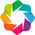

In [ ]:
# plotting modules
import hvplot.pandas  # noqa
import hvplot.xarray  # noqa
import holoviews as hv
from holoviews import opts
from bokeh.models import FixedTicker
hv.extension('bokeh', 'matplotlib')
#pd.options.plotting.backend = 'holoviews'
pd.options.plotting.backend = 'hvplot'
import seaborn as sns
import cartopy.crs as ccrs
from IPython.display import Image
import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline

In [ ]:
# define Pandas display settings
pd.set_option('display.max_rows', 50)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

gstiles = hv.Tiles('https://mt1.google.com/vt/lyrs=s&x={X}&y={Y}&z={Z}', name='Google Satellite')
ottiles = hv.Tiles('https://tile.opentopomap.org/{Z}/{X}/{Y}.png', name='Open Topo')

In [ ]:
sys.path.append(os.path.join(os.environ['GMTSAR'],'gmtsar', 'py'))

from PRM import PRM
from SBAS import SBAS

In [ ]:
WORKDIR      = 'raw'
DATADIR      = 'data'
CORRLIMIT    = 0.10
DEFOMAX      = 0

In [ ]:
sbas = SBAS(DATADIR, basedir=WORKDIR)
sbas.to_dataframe()

,metapath,metafile,filename,subswath,satellite,stem,multistem,orbitpath,orbitfile,orbitname,datapath,datafile
date,,,,,,,,,,,,
2016-04-08,data/s1a-iw1-slc-vv-20160408t091355-20160408t091428-010728-01001f-001.xml,s1a-iw1-slc-vv-20160408t091355-20160408t091428-010728-01001f-001.xml,s1a-iw1-slc-vv-20160408t091355-20160408t091428-010728-01001f-001,iw1,S1A,S1_20160408_091355_F1,S1_20160408_ALL_F1,NaN,NaN,NaN,data/s1a-iw1-slc-vv-20160408t091355-20160408t091428-010728-01001f-001.tiff,s1a-iw1-slc-vv-20160408t091355-20160408t091428-010728-01001f-001.tiff
2016-04-20,data/s1a-iw1-slc-vv-20160420t091355-20160420t091423-010903-010569-001.xml,s1a-iw1-slc-vv-20160420t091355-20160420t091423-010903-010569-001.xml,s1a-iw1-slc-vv-20160420t091355-20160420t091423-010903-010569-001,iw1,S1A,S1_20160420_091355_F1,S1_20160420_ALL_F1,NaN,NaN,NaN,data/s1a-iw1-slc-vv-20160420t091355-20160420t091423-010903-010569-001.tiff,s1a-iw1-slc-vv-20160420t091355-20160420t091423-010903-010569-001.tiff


In [ ]:
# also, we can place pre-downloaded orbit files to data directory
sbas.download_orbits()

MD5 checksumming:   0%|          | 0.00/4.41M [00:00<?, ?B/s]

MD5 checksumming:   0%|          | 0.00/4.41M [00:00<?, ?B/s]

In [ ]:
sbas.download_dem()

download_dem Warning 5: NOTICE: Format set to NC4C because compression is set to DEFLATE.



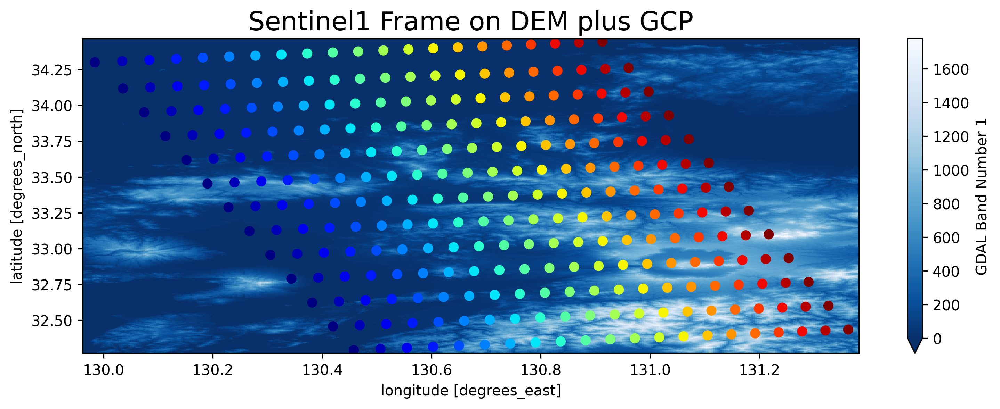

In [ ]:
plt.figure(figsize=(12,4), dpi=300)
sbas.get_dem()[::4,::4].plot.imshow(cmap='Blues_r', vmin=0)
plt.scatter(sbas.geoloc()['longitude'], sbas.geoloc()['latitude'], c=sbas.geoloc()['pixel'], cmap='jet')
plt.title('Sentinel1 Frame on DEM plus GCP', fontsize=18)
plt.show()

In [ ]:
sbas.stack_parallel()

Aligning:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
%%time

sbas.topo_ra()

Range and azimuth decimation: 2/2
CPU times: user 2min 57s, sys: 40.9 s, total: 3min 38s
Wall time: 4min 5s


In [ ]:
topo_ra = xr.open_dataarray(f'{WORKDIR}/topo_ra.grd')

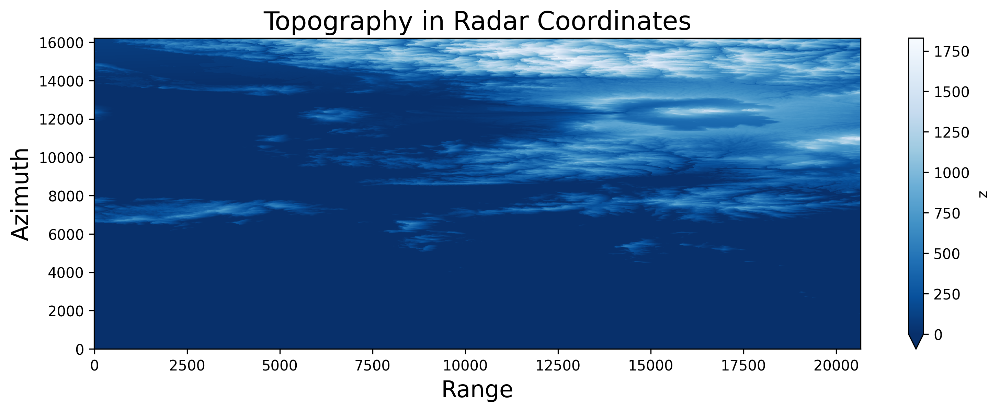

In [ ]:
plt.figure(figsize=(12,4), dpi=300)
topo_ra[::4,::4].plot.imshow(cmap='Blues_r', vmin=0)
plt.xlabel('Range', fontsize=16)
plt.ylabel('Azimuth', fontsize=16)
plt.title('Topography in Radar Coordinates', fontsize=18)
plt.show()

In [ ]:
pairs = [sbas.to_dataframe().index]

In [ ]:
# we can just miss "func" argument when post-processing is not required
# define a postprocessing function for decimation, etc.
decimator = lambda dataarray: dataarray.coarsen({'y': 4, 'x': 4}, boundary='trim').mean()

# default parameters: wavelength=200, psize=32, func=None (no postprocessing)
sbas.intf_parallel(pairs, func=decimator)

Interferograms:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
phasefilts = sbas.open_grids(pairs, 'phasefilt', geocode=True)
corrs = sbas.open_grids(pairs, 'corr', geocode=True)

Geocoding:   0%|          | 0/1 [00:00<?, ?it/s]

Geocoding:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# crop grid for visualization
phasefilt = xr.where(corrs[0]>CORRLIMIT, phasefilts[0], np.nan)
#.sel(lat=slice(34.9, 35.3), lon=slice(25, 25.5))

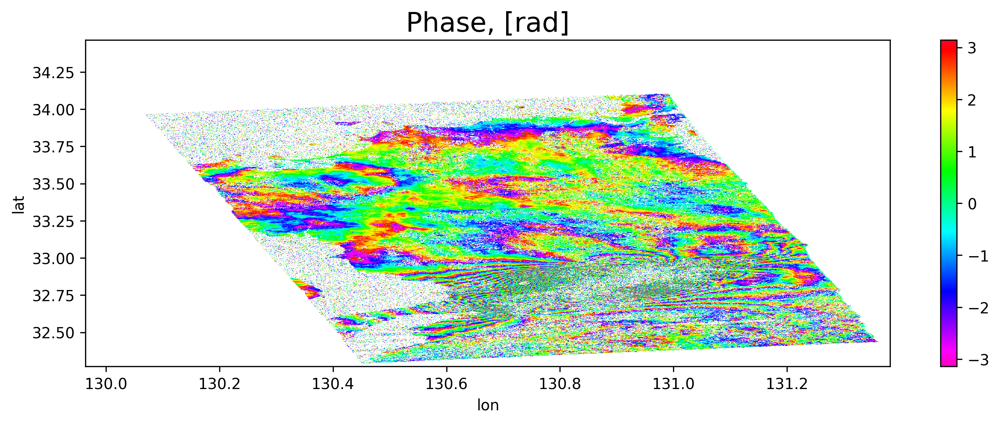

In [ ]:
plt.figure(figsize=(12,4), dpi=300)
phasefilt.plot.imshow(vmin=-np.pi, vmax=np.pi, cmap='gist_rainbow_r')
plt.title('Phase, [rad]', fontsize=18)
plt.show()

In [ ]:
# generate a custom snaphu config file and use it as argument "conf" value
# conf = self.PRM().snaphu_config(defomax=0)

# we can just miss "func" argument when post-processing is not required
# define a post-processing function to crop and interpolate low-coherence areas, etc.
#cleaner = lambda corr, unwrap: xr.where(corr>=CORRLIMIT, unwrap, np.nan)
cleaner = lambda corr, unwrap: sbas.nearest_grid(xr.where(corr>=CORRLIMIT, unwrap, np.nan))

# default parameters: threshold=0.1, conf=None, func=None (no postprocessing required)
sbas.unwrap_parallel(pairs, threshold=CORRLIMIT, func=cleaner)

Unwrapping:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
los_disp_mm = sbas.open_grids(pairs, 'unwrap', func=sbas.los_displacement_mm, geocode=True)

Geocoding:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# crop grid for visualization
#los_disp_mm = xr.where(corrs[0]>0.2, los_disp_mm[0], np.nan)
#.sel(lat=slice(34.9, 35.3), lon=slice(25, 25.5))
los_disp_mm = los_disp_mm[0]

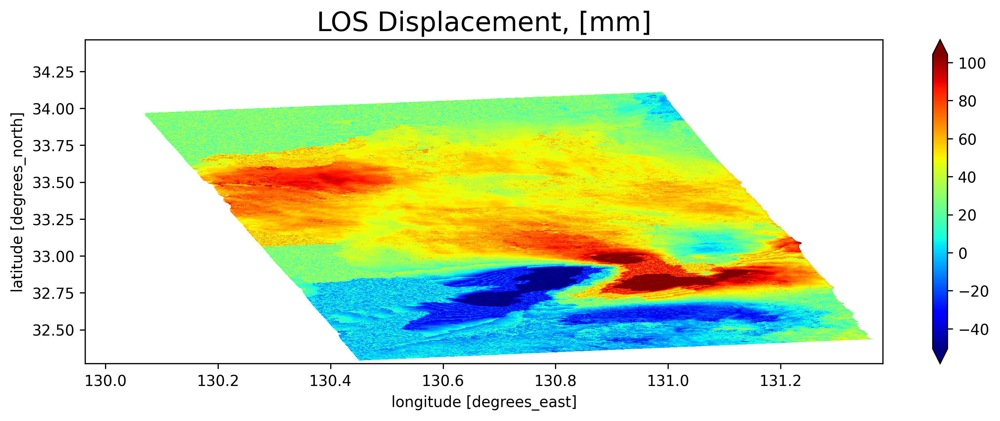

In [ ]:
plt.figure(figsize=(12,4), dpi=300)
zmin, zmax = np.nanquantile(los_disp_mm, [0.01, 0.99])
los_disp_mm.plot.imshow(vmin=zmin, vmax=zmax, cmap='jet')
plt.title('LOS Displacement, [mm]', fontsize=18)
plt.show()